In [2]:
%matplotlib inline
import sys
sys.path.append("..") # Adds the module to path

# Example 2.5 Single particle analysis

We extend the previous example to also predict the z position and the radius of the particle. To achieve this, we narrow the input space to a single optical setup.

## 1. Setup

Imports the objects needed for this example.

In [108]:
import numpy as np
import matplotlib.pyplot as plt

from deeptrack.scatterers import PointParticle
from deeptrack.optics import Fluorescence
from deeptrack.noises import Poisson, Offset
from deeptrack.math import NormalizeMinMax
from deeptrack.generators import ContinuousGenerator
from deeptrack.augmentations import FlipLR, FlipUD, FlipDiagonal, PreLoad
from deeptrack.features import ConditionalSetFeature
from deeptrack.models import UNet
from deeptrack.losses import flatten, weighted_crossentropy

IMAGE_SIZE = 256

## 2. Defining the dataset

### 2.1 Defining the training set

The training set consists of simulated 48 by 48 pixel images, containing a single particle each. The particles are simulated as spheres with a radius between 0.5 microns and 1 micron, and a refractive index between 1.4 and 1.6. Its position in the camera plane is constrained to be within the image, and is sampled with a normal distribution with standard deviation of 5 pixel units in along the axis normal to the camera plane. 

In [127]:
particle = PointParticle(
    position=lambda: np.random.rand(2) * IMAGE_SIZE,
    z=lambda: np.random.randn() * 5,
    intensity=lambda: 1 + np.random.rand() * 9,
    position_unit="pixel",
)

number_of_particles = lambda: np.random.randint(10, 30)

particles = particle ** number_of_particles

The particle is imaged using a brightfield microscope with NA of 0.7, illuminating laser wavelength of 633 nm, a magnification of 5, and a random illumination gradient.

In [135]:
optics = Fluorescence(
    NA=lambda: 0.6 + np.random.rand() * 0.2,
    wavelength=500e-9,
    resolution=1e-6,
    magnification=10,
    output_region=(0, 0, IMAGE_SIZE, IMAGE_SIZE),
)

The noise is simulated as poisson noise with an signal to noise ratio between 10 and 50. The image is finally normalized by rescaling it to values between 0 and 1.

In [140]:

normalization = NormalizeMinMax(
    min=lambda: np.random.rand() * 0.4,
    max=lambda min: min + 0.1 + np.random.rand() * 0.3,
)

noise = Poisson(
    snr=lambda: 4 + np.random.rand() * 3,
    background=lambda: normalization.min
)


We now define how these objects combine. Calling the optics object with the particle object tells DeepTrack to that is should image that particle using that optical device. We define an augmented version of `imaged_particle` which will increase the speed of the training. To bypass this augmentation during validation we create a conditional feature, which calls `imaged_particle` directly if `skip_augmentation=True`.

Finally we add in the noise and the normalization.

In [141]:
imaged_particle = optics(particles)

dataset = imaged_particle + normalization + noise

### 2.2 Defining the training label

The training label is extracted directly from the image as the `position` property divided by the image size, such that the posible values are contained within 0 and 1. Additionally, we append the z-position of the particle in pixels divided by 10, and the radius in microns.

In [142]:
CIRCLE_RADIUS = 3
import skimage

def get_label(image_of_particles):
    target_image = np.zeros(image_of_particles.shape)
    X, Y = np.meshgrid(
        np.arange(0, image_of_particles.shape[0]), 
        np.arange(0, image_of_particles.shape[1])
    )

    for property in image_of_particles.properties:
        if "position" in property:
            position = property["position"]

            distance_map = (X - position[1])**2 + (Y - position[0])**2
            circle = distance_map < CIRCLE_RADIUS**2
            target_image[circle] = 1

    return target_image

### 2.3 Visualizing the dataset

We resolve and show 16 images, with a green circle indicating the particle position.

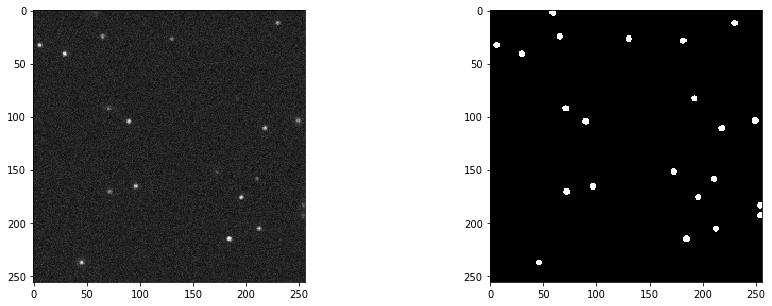

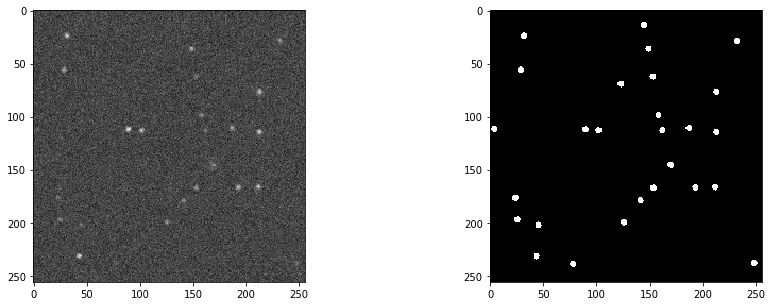

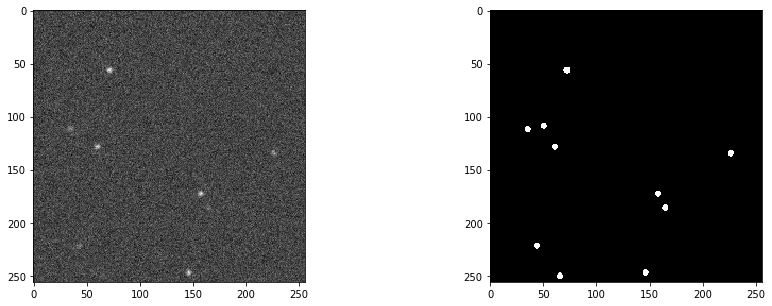

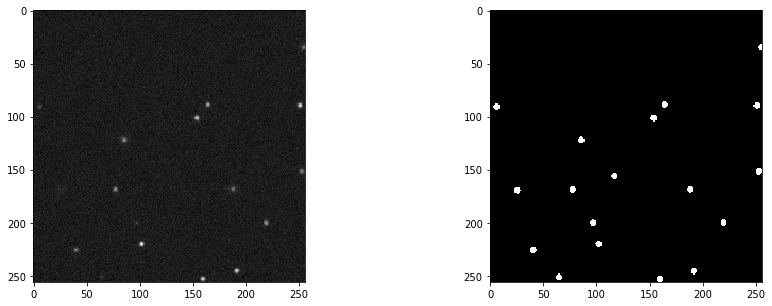

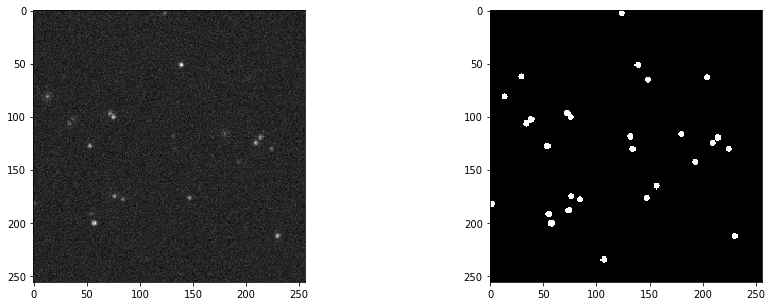

...

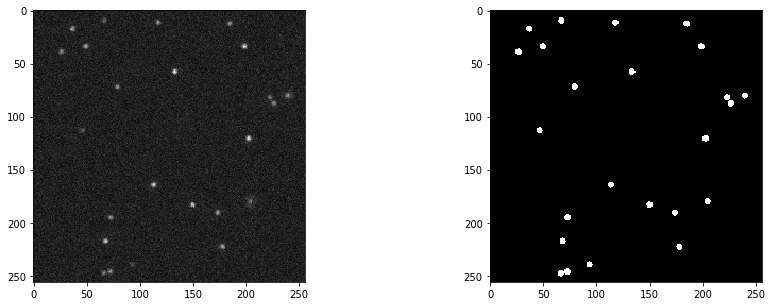

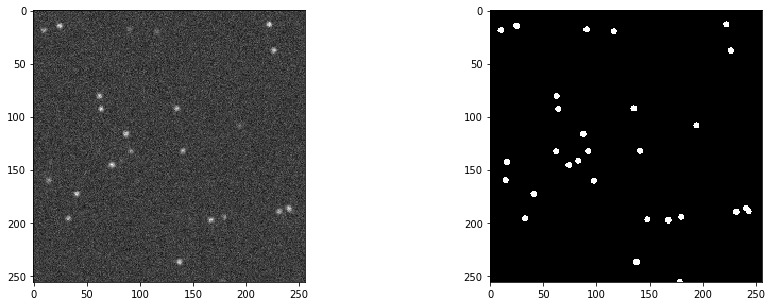

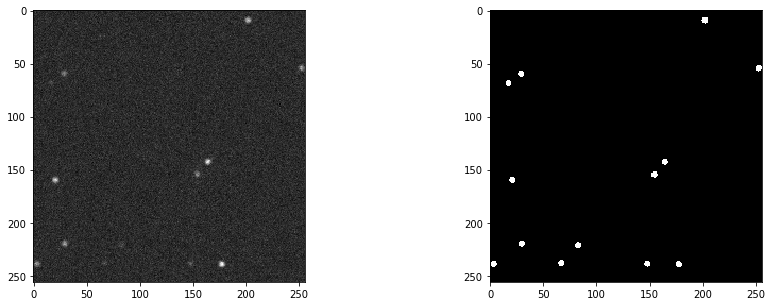

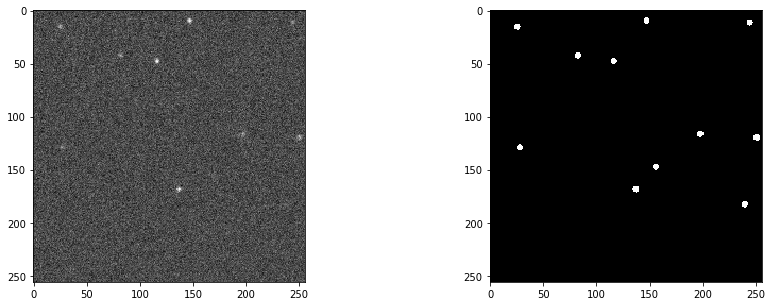

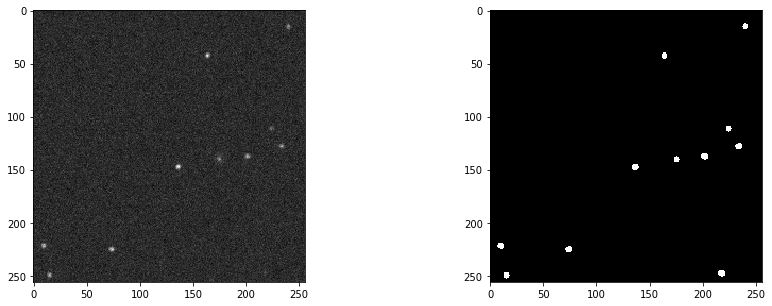

In [143]:
NUMBER_OF_IMAGES = 16

for _ in range(NUMBER_OF_IMAGES):
    plt.figure(figsize=(15, 5))
    dataset.update()
    image_of_particle = dataset.resolve(skip_augmentations=True)
    particle_label = get_label(image_of_particle)
    plt.subplot(1, 2, 1)
    plt.imshow(image_of_particle[..., 0], cmap="gray")
    plt.subplot(1, 2, 2)
    plt.imshow(particle_label[..., 0] * 1.0, cmap="gray")
    plt.show()
    

## 3. Defining the network

The network used is a Convolutional network, with a the pixel error as loss.

In [144]:
import tensorflow.keras.backend as K
import tensorflow.keras.optimizers as optimizers


model = UNet(
    (None, None, 1), 
    conv_layers_dimensions=[16, 32, 64],
    base_conv_layers_dimensions=[128, 128], 
    loss=flatten(weighted_crossentropy((10, 1))),
    metrics=[flatten(weighted_crossentropy((1, 1)))],
    output_activation="sigmoid"
)

# model.load_weights("./quantumdots.h5")

model.summary()

Model: "model_3"
__________________________________________________________________________________________________
Layer (type)                    Output Shape         Param #     Connected to                     
input_3 (InputLayer)            (None, None, None, 1 0                                            
__________________________________________________________________________________________________
conv2d_23 (Conv2D)              (None, None, None, 1 160         input_3[0][0]                    
__________________________________________________________________________________________________
max_pooling2d_7 (MaxPooling2D)  (None, None, None, 1 0           conv2d_23[0][0]                  
__________________________________________________________________________________________________
conv2d_24 (Conv2D)              (None, None, None, 3 4640        max_pooling2d_7[0][0]            
____________________________________________________________________________________________

## 4. Training the network

The network is trained similarly to example 2.

In [145]:

validation_set_size = 50

validation_set = [dataset.update().resolve() for _ in range(validation_set_size)]
validation_labels = [get_label(image) for image in validation_set]

generator = ContinuousGenerator(
    dataset,
    get_label,
    batch_size=lambda ep, nd: 4 if ep < 20 else 16,
    min_data_size=250,
    max_data_size=1e5
)

with generator:
    
    h = model.fit(generator,
                  epochs=10,
                     validation_data=(
                          np.array(validation_set),
                          np.array(validation_labels)
                      ))
    
    model.compile(loss=flatten(weighted_crossentropy((1, 1))), optimizer="adam")

    h2 = model.fit(generator,
                  epochs=100,
                  validation_data=(
                      np.array(validation_set),
                      np.array(validation_labels)
                  ))

Epoch 1/10 249 / 250 samples before starting training
63/63 [==============================] - 6s 90ms/step - loss: 0.0369 - nd_unet_crossentropy: 0.1183 - val_loss: 0.0271 - val_nd_unet_crossentropy: 0.0447
Epoch 2/10
66/66 [==============================] - 4s 57ms/step - loss: 0.0242 - nd_unet_crossentropy: 0.0467 - val_loss: 0.0224 - val_nd_unet_crossentropy: 0.0197
Epoch 3/10
67/67 [==============================] - 3s 45ms/step - loss: 0.0110 - nd_unet_crossentropy: 0.0235 - val_loss: 0.0061 - val_nd_unet_crossentropy: 0.0166
Epoch 4/10
68/68 [==============================] - 3s 47ms/step - loss: 0.0052 - nd_unet_crossentropy: 0.0117 - val_loss: 0.0044 - val_nd_unet_crossentropy: 0.0071
Epoch 5/10
69/69 [==============================] - 4s 51ms/step - loss: 0.0046 - nd_unet_crossentropy: 0.0107 - val_loss: 0.0044 - val_nd_unet_crossentropy: 0.0054
Epoch 6/10
70/70 [==============================] - 4s 51ms/step - loss: 0.0041 - nd_unet_crossentropy: 0.0092 - val_loss: 0.0042 - 

## 5. Evaluating the network

### 5.1 Loss vs validation
We plot the metrics evaluated on the training data compared to the validation data to spot potential overtraining. 

KeyError: 'val_loss'

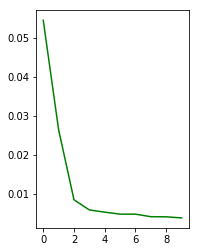

In [12]:
plt.subplot(1, 2, 1)
plt.plot(h.history["loss"], 'g')
plt.plot(h.history["val_loss"], 'r')
plt.legend(["loss", "val_loss"])
plt.plot()

### 5.2 Prediction visualization

We show a few images, with the true position as a green circle, and the predicted position as a blue cross.

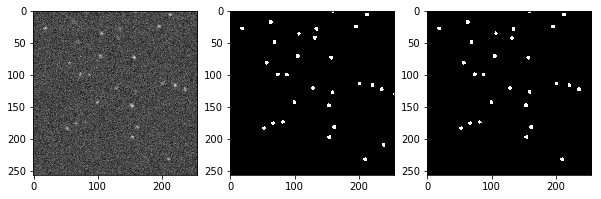

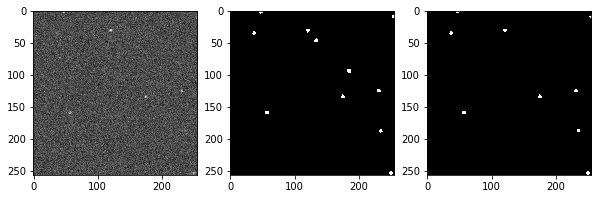

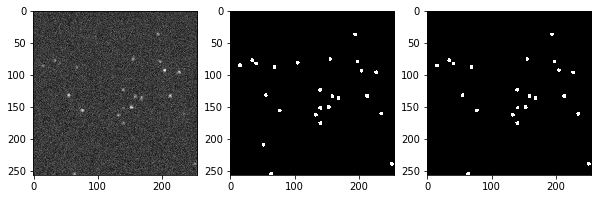

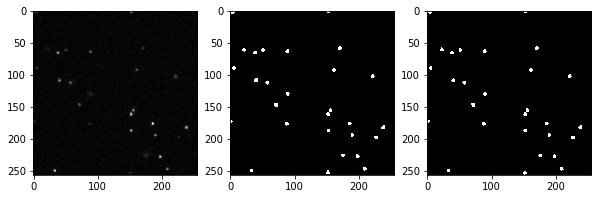

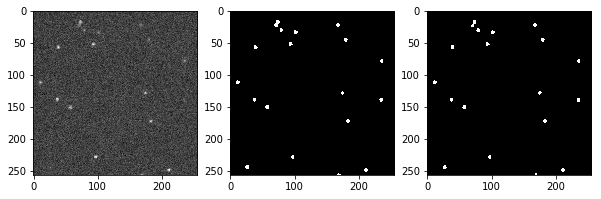

...

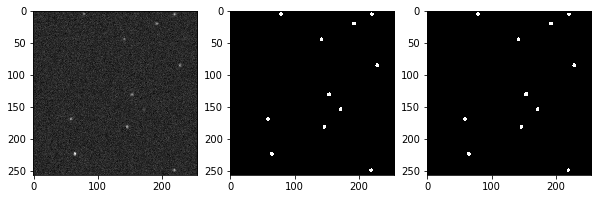

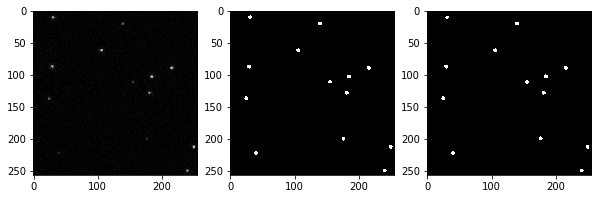

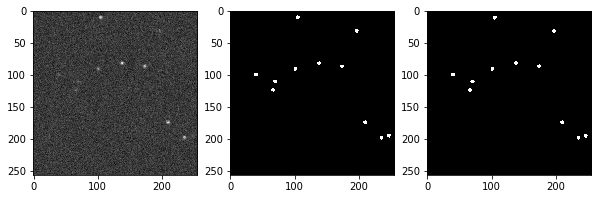

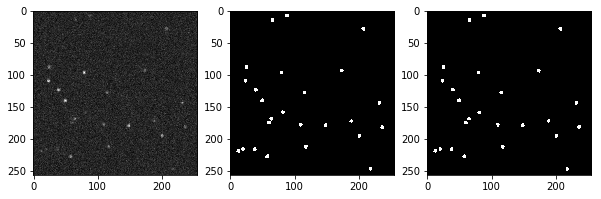

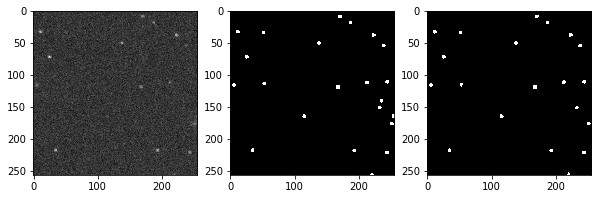

In [146]:
NUMBER_OF_IMAGES = 16


for _ in range(NUMBER_OF_IMAGES):
    plt.figure(figsize=(10, 10))
    dataset.update()
    image_of_particle = dataset.resolve(skip_augmentations=True)
    
    predicted_mask = model.predict(np.array([image_of_particle]))
    particle_label = get_label(image_of_particle)
    plt.subplot(1, 3, 1)
    plt.imshow(image_of_particle[..., 0], cmap="gray")
    plt.subplot(1, 3, 2)
    plt.imshow(particle_label[..., 0] * 1.0, cmap="gray")
    plt.subplot(1, 3, 3)
    plt.imshow(predicted_mask[0, ..., 0] > 0.5, cmap="gray")
    plt.show()

### 5.3 Prediction vs actual

We show the prediction of each output versus the ground truth

In [79]:
from deeptrack.features import LoadImage
import skimage
images = skimage.io.imread("./datasets/QuantumDots/Qdots.tif")

In [80]:
images = np.expand_dims(images, axis=-1) / 255 

In [152]:
predictions = model.predict(images*2 - 0.2, batch_size=4)

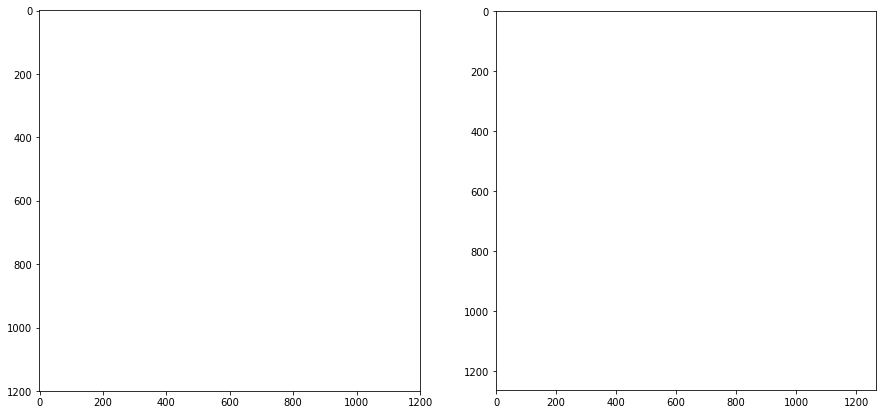

In [272]:
frames = []
from matplotlib import animation
from IPython.display import display, HTML

fig = plt.figure(figsize=(15, 7))
ax0 = plt.subplot(1,2,1)

ax2 = plt.subplot(1,2,2)

for prediction, image, _ in zip(predictions[20:], images[20:], range(20,40)):
    
    artists = []
    mask = prediction[:,:,0] > 0.99
    
    cs = np.array(skimage.measure.regionprops(skimage.measure.label(mask)))
    
    cs = np.array([c["Centroid"] for c in cs])
    
   
    artists += [ax0.imshow(image[:,:,0], vmin=0.15, vmax=0.5, cmap="gray")]
    

    
    artists += [ax2.imshow(image[:,:,0], vmin=0.15, vmax=0.5, cmap="gray")]
    artists += [ax2.scatter(cs[:, 1], cs[:, 0], 100, facecolors="none", edgecolors="c")]
    
    frames.append(artists)
    
anim = animation.ArtistAnimation(fig, frames)

display(HTML(anim.to_jshtml()))

### 5.4 Prediction vs property value

We show the pixel error as a function of some properties.

In [269]:
positions = []

for prediction in predictions:
    
    artists = []
    mask = prediction[:,:,0] > 0.99
    
    cs = np.array(skimage.measure.regionprops(skimage.measure.label(mask)))
    
    cs = [c["Centroid"] for c in cs]
    
    positions.append(cs)


max_err = 3
traces = []
completed = []
frame = 0
num_obs = 0
for ps in positions:
    
    eps = np.array([trace[-1] for trace in traces])
    found = np.zeros((len(eps)))
    
    new_traces = []
    for p in ps:
        num_obs += 1
        if eps.size:
            d = np.sqrt((p[0] - eps[:,0])**2 + (p[1] - eps[:,1])**2)

            idx = np.argmin(d)
            if d[idx] < max_err:
                traces[idx].append(p)
                found[idx] = True
                continue

        new_traces.append([p])
        
        
    for trace, wasfound in zip(traces, found):
        if wasfound:
            new_traces.append(trace)
        else:
            completed.append(trace)
    traces = new_traces
        
        
    frame += 1
    print(frame, str(len(trace)), end="\r")
    
completed += traces

In [270]:
tracelength = [len(trace) for trace in completed]

In [271]:
x = np.arange(2,5)
y = np.zeros_like(x)

for xx, i in zip(x, range(1000)):
    y[i] = np.sum(np.array(tracelength) < xx)
    
y[0] / num_obs

0.051971885494563115

In [287]:
import scipy.io as io

validation_set_size = 500

validation_set = [dataset.update().resolve() for _ in range(validation_set_size)]
validation_labels = [get_label(image) for image in validation_set]


training_data = np.array(validation_set)
training_labels = np.array(validation_labels)

training_predictions = model.predict(training_data)

io.savemat("../../figures/qdots_data.mat", {
    "prediction": predictions[:40],
    "data": images[:40],
    "training_data":training_data,
    "training_labels":training_labels,
    "training_predictions":training_predictions
})